<a href="https://colab.research.google.com/github/rohitha3007/INSE6220/blob/main/INSE6220_DRYBEAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and Classification of Dry Bean**


**Install Pycaret**

In [1]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==3.0.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: pycaret
    Found existing installation: pycaret 3.2.0
    Uninstalling pycaret-3.2.0:
      Successfully uninstalled pycaret-3.2.0


In [2]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.0.0'

**Import Libraries**

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [4]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


**Dataset**

Dry bean, the most widely produced edible legume crop worldwide, has a broad variety of genetic variability. The dataset used has 10 Attributes to classify dry bean and evluate the quality.

In this study Barbunya,Seker are two different varieties of DryBean were used

Attribute Information:

1. Area
2. Perimeter
3. MajorAxisLength
4. MinorAxisLength
5. AspectRation
6. Eccentricity
7. ConvexArea
8. EquivDiameter
9. Extent
10. Roundness


https://www.muratkoklu.com/datasets/



In [5]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/rohitha3007/INSE6220/main/INSE6220_DryBean.csv')
df.head(25)

,A,PR,MA,ML,AR,EC,CA,ED,EX,R,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.958027,1
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.887034,1
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.947849,1
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.903936,1
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.984877,1
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.943852,1
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.853080,1
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.967109,1
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.954240,1
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.970278,1


In [6]:
len(df.index)

3349

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3349 entries, 0 to 3348
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   A       3349 non-null   int64  
 1   PR      3349 non-null   float64
 2   MA      3349 non-null   float64
 3   ML      3349 non-null   float64
 4   AR      3349 non-null   float64
 5   EC      3349 non-null   float64
 6   CA      3349 non-null   int64  
 7   ED      3349 non-null   float64
 8   EX      3349 non-null   float64
 9   R       3349 non-null   float64
 10  Class   3349 non-null   int64  
dtypes: float64(8), int64(3)
memory usage: 287.9 KB


In [8]:
print("Number of duplicated rows is: ", df.duplicated().sum())


Number of duplicated rows is:  0


In [9]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

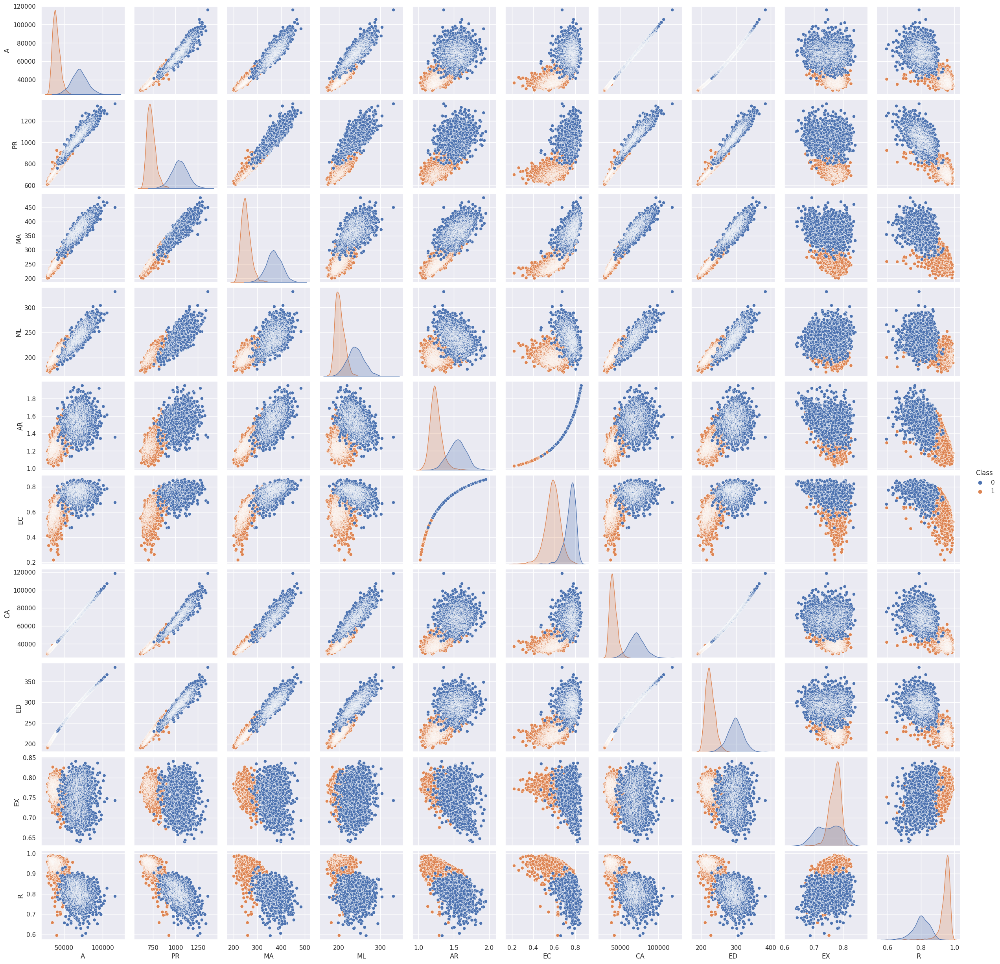

In [10]:
sns.pairplot(df, hue='Class')
plt.show()

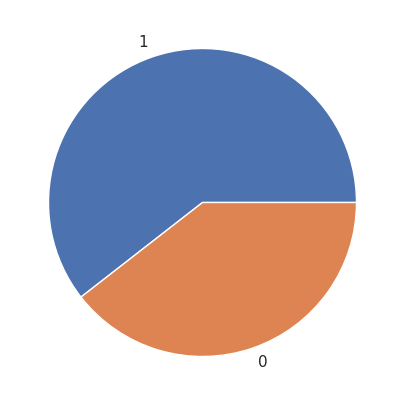

In [11]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [12]:
X = df.drop(columns=['Class'])
X.head(10)

,A,PR,MA,ML,AR,EC,CA,ED,EX,R
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.958027
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.887034
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.947849
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.903936
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.984877
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.943852
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.853080
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.967109
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.954240
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.970278


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
A,3349.0,51693.179755,16413.178607,28395.000000,38284.000000,44290.000000,66437.000000,115967.000000
PR,3349.0,853.372307,169.673227,610.291000,711.966000,769.972000,1016.789000,1359.763000
MA,3349.0,298.168807,63.421736,200.524796,245.315108,268.781170,359.009355,483.691256
ML,3349.0,217.067731,24.086933,171.210559,197.902295,210.426187,233.447472,331.305270
AR,3349.0,1.363295,0.178206,1.024868,1.221665,1.305059,1.510442,1.950371
EC,3349.0,0.651842,0.104696,0.218951,0.574428,0.642544,0.749453,0.858554
CA,3349.0,52410.399224,16828.627216,28715.000000,38651.000000,44681.000000,67735.000000,118497.000000
ED,3349.0,253.513184,39.361511,190.141097,220.782025,237.469534,290.843971,384.257427
EX,3349.0,0.762831,0.031300,0.639787,0.747659,0.769472,0.784399,0.840577
R,3349.0,0.887543,0.080816,0.593708,0.815674,0.926886,0.955628,0.990685


**Standardize the Data**

In [14]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,A,PR,MA,ML,AR,EC,CA,ED,EX,R
0,-1.419692,-1.432858,-1.419137,-1.792899,-0.932222,-0.974678,-1.408251,-1.610242,0.034865,0.872280
1,-1.399035,-1.269419,-1.539828,-1.425604,-1.492526,-2.293234,-1.381091,-1.581487,0.675400,-0.006305
2,-1.359670,-1.351401,-1.345839,-1.708093,-0.861949,-0.851301,-1.350306,-1.527158,0.488314,0.746326
3,-1.321403,-1.223053,-1.381607,-1.434652,-1.176657,-1.463750,-1.288854,-1.474913,0.634280,0.202876
4,-1.313359,-1.374838,-1.518964,-1.112323,-1.697703,-3.039368,-1.307099,-1.464001,0.328059,1.204564
5,-1.304889,-1.287639,-1.350027,-1.476438,-1.078841,-1.255643,-1.296223,-1.452536,0.410834,0.696852
6,-1.292824,-1.080705,-1.373845,-1.371433,-1.215212,-1.551045,-1.274234,-1.436251,-0.013737,-0.426503
7,-1.290265,-1.318291,-1.343148,-1.425489,-1.109576,-1.319085,-1.281544,-1.432803,0.250851,0.984676
8,-1.280149,-1.283195,-1.334673,-1.408052,-1.108108,-1.316015,-1.269836,-1.419199,0.278960,0.825410
9,-1.271070,-1.305282,-1.276425,-1.501879,-0.911779,-0.938090,-1.265319,-1.407020,0.666283,1.023894


In [15]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
A,3349.0,0.000000e+00,1.000149,-1.419692,-0.817098,-0.451118,0.898426,3.916573
PR,3349.0,6.789301e-17,1.000149,-1.432858,-0.833528,-0.491608,0.963270,2.984951
MA,3349.0,-6.110370e-16,1.000149,-1.539828,-0.833493,-0.463438,0.959444,2.925656
ML,3349.0,1.154181e-15,1.000149,-1.904104,-0.795797,-0.275773,0.680128,4.743427
AR,3349.0,9.505021e-16,1.000149,-1.899356,-0.794869,-0.326834,0.825834,3.294852
EC,3349.0,-3.394650e-16,1.000149,-4.135356,-0.739526,-0.088819,0.932465,1.974700
CA,3349.0,1.357860e-16,1.000149,-1.408251,-0.817741,-0.459369,0.910763,3.927621
ED,3349.0,1.289967e-15,1.000149,-1.610242,-0.831677,-0.407658,0.948550,3.322123
EX,3349.0,2.376255e-16,1.000149,-3.931735,-0.484803,0.212194,0.689175,2.484269
R,3349.0,-5.431440e-16,1.000149,-3.636375,-0.889417,0.486896,0.842591,1.276445


**Observations and Variables**

In [16]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

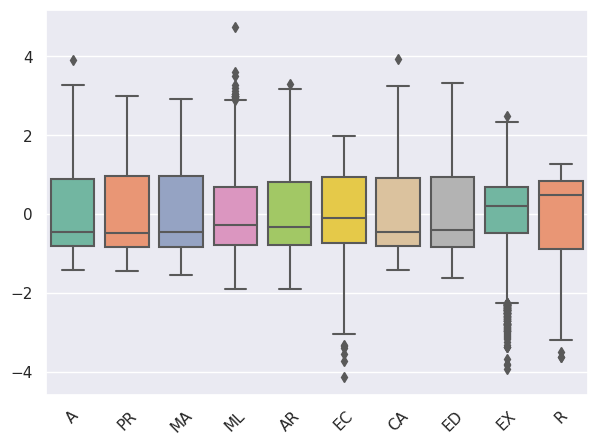

In [17]:
bx = plt.figure()
bx = sns.boxplot(data=X, orient="v", palette="Set2")
bx.set_xticklabels(bx.get_xticklabels(),rotation=45);

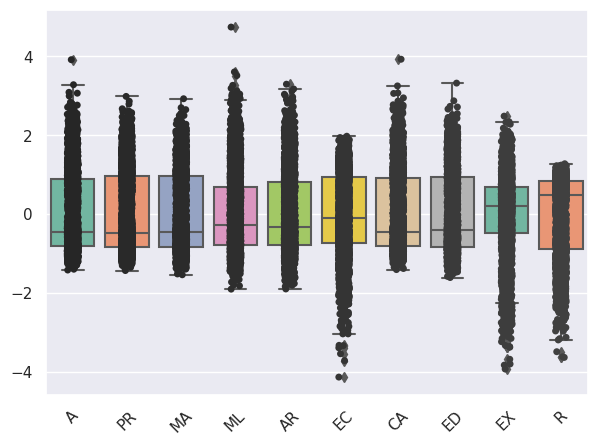

In [18]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
bx = plt.figure()
bx = sns.boxplot(data=X, orient="v", palette="Set2")
bx = sns.stripplot(data=X, color=".25")
bx.set_xticklabels(bx.get_xticklabels(),rotation=45);

**Correlation Matrix**

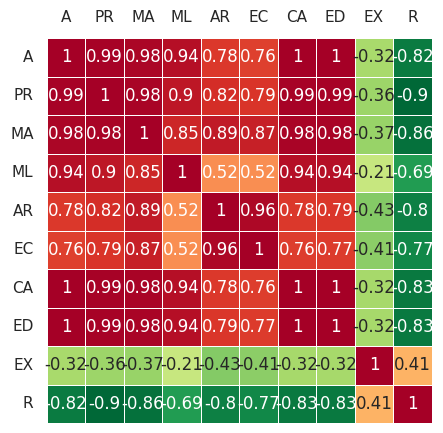

In [19]:
bx = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
bx.tick_params(labelbottom=False,labeltop=True)
bx.set_xticklabels(bx.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

#**Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

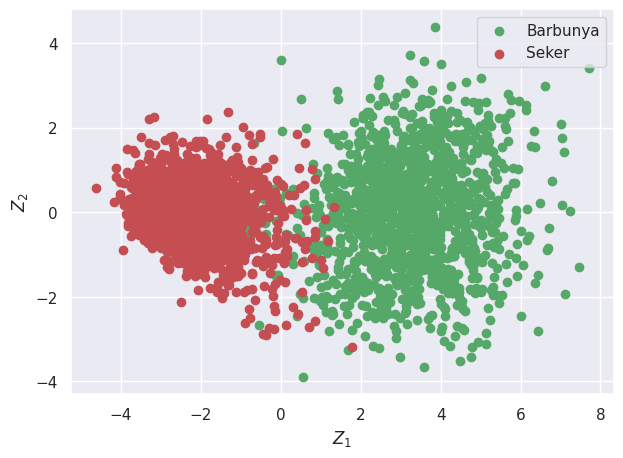

In [20]:
pca = PCA()
Z = pca.fit_transform(X)
idx_Barbunya= np.where(y == 0)
idx_Seker = np.where(y == 1)
plt. figure()
plt.scatter(Z[idx_Barbunya,0], Z[idx_Barbunya,1], c='g', label='Barbunya')
plt.scatter(Z[idx_Seker,0], Z[idx_Seker,1], c='r', label='Seker')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigen Vectors**

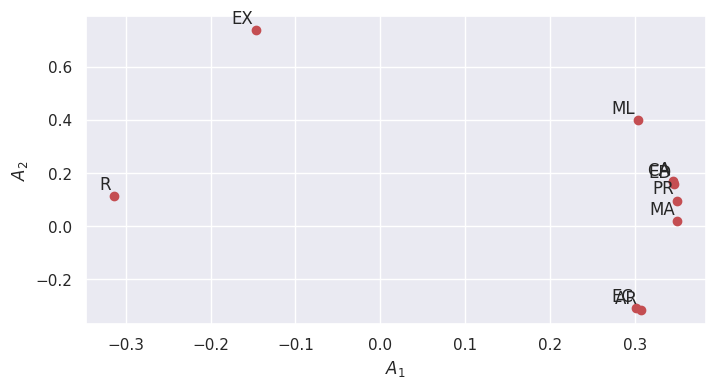

In [21]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')



Eigen Vector

In [22]:
print (list(A))

[array([ 0.34473556,  0.17075875, -0.09498212, -0.13153331,  0.0925477 ,
        0.481723  , -0.23828111,  0.11903402, -0.43124598, -0.57282984]), array([ 0.34911776,  0.09621829, -0.05385458,  0.14360002,  0.03619307,
        0.07090157,  0.8726989 ,  0.27746791, -0.01390073, -0.01468141]), array([ 0.35017009,  0.01851157,  0.07308106, -0.13548234,  0.26234948,
       -0.0457432 ,  0.09730699, -0.68349917,  0.46752012, -0.295309  ]), array([ 0.30391555,  0.39973736, -0.36454285, -0.09164093, -0.28847622,
       -0.57638277, -0.19961422,  0.27020025,  0.21931067, -0.17369231]), array([ 0.30739155, -0.31553196,  0.43485187, -0.13867705,  0.53508355,
       -0.3609596 , -0.15670942,  0.39263996, -0.04557823,  0.01466143]), array([ 0.30158321, -0.30724377,  0.46175491, -0.24254442, -0.73246382,
        0.06756749,  0.0102829 , -0.01148721,  0.02917873, -0.02111225]), array([ 0.34515152,  0.16697043, -0.0959587 , -0.11069439,  0.08779567,
        0.49567428, -0.23572651,  0.20001679,  0.41

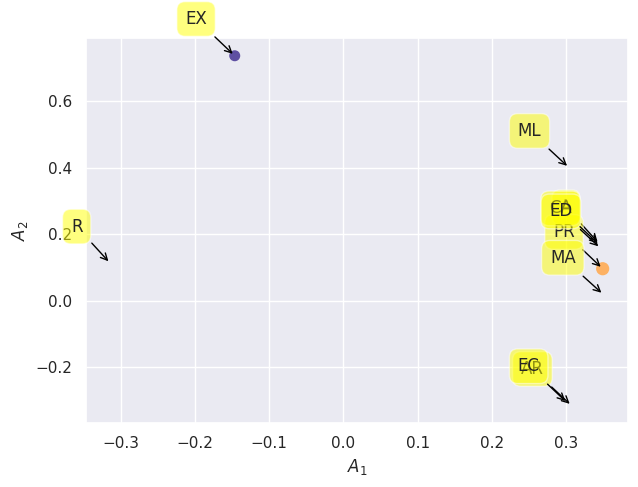

In [23]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->',color='black', connectionstyle='arc3,rad=0'))

**Scree Plot**

[8.06792635e+00 1.03045244e+00 6.24495374e-01 2.30917592e-01
 4.18687028e-02 5.92850546e-03 9.55529979e-04 3.72578023e-04
 4.96059202e-05 2.01853537e-05]


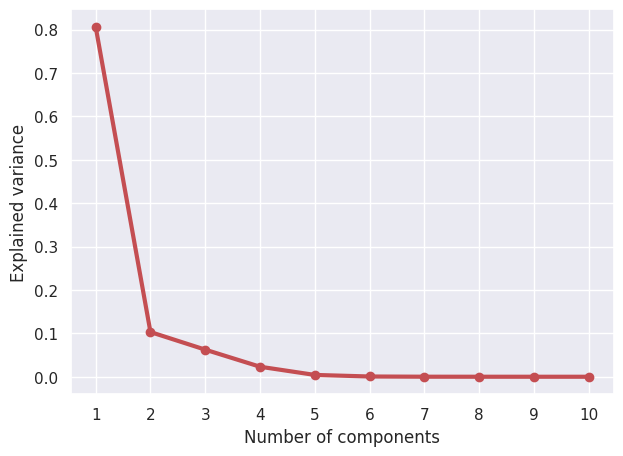

In [24]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
print(Lambda)

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

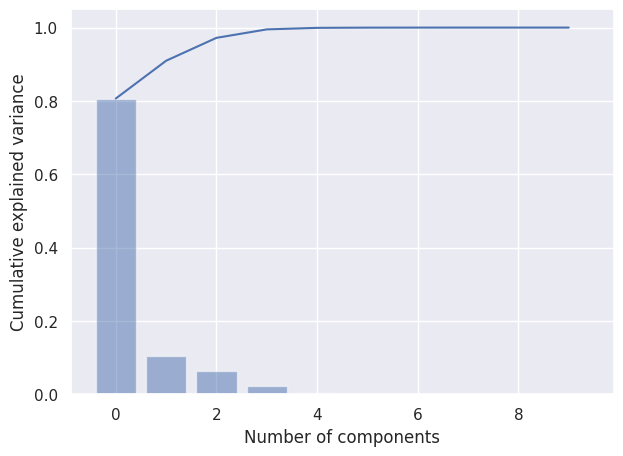

In [25]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([-0.89532531,  0.23229591, -0.5595866 , ...,  1.42162745,
        1.76744933,  3.40675213])

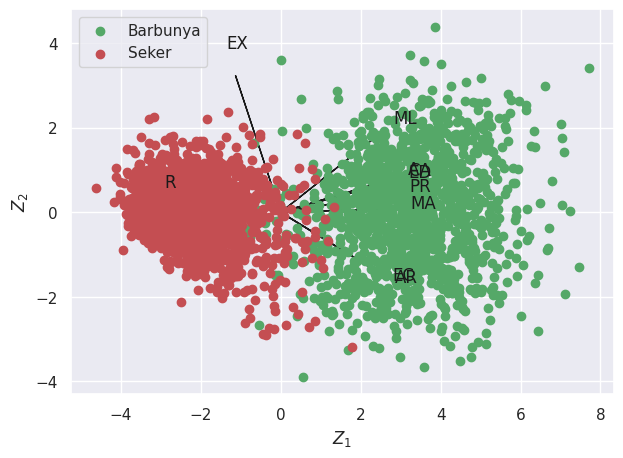

In [26]:
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Barbunya,0], Z[idx_Barbunya,1], c='g', label='Barbunya')
plt.scatter(Z[idx_Seker,0], Z[idx_Seker,1], c='r', label='Seker')
plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [27]:
!pip install pca

In [28]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [29]:
out['PC']

,PC1,PC2,PC3
0,-3.934193,-0.895325,0.137875
1,-4.169139,0.232296,-0.396024
2,-3.752888,-0.559587,0.482174
3,-3.717217,-0.079718,0.071021
4,-4.625089,0.567718,-1.269064
...,...,...,...
3344,7.000607,2.095529,0.673467
3345,6.603226,2.989020,0.260651
3346,7.081578,1.421627,-1.087736
3347,7.045462,1.767449,-0.952496


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '3 Principal Components explain [99.50%] of the variance'}, xlabel='PC1 (80.6% expl.var)', ylabel='PC2 (10.3% expl.var)'>)

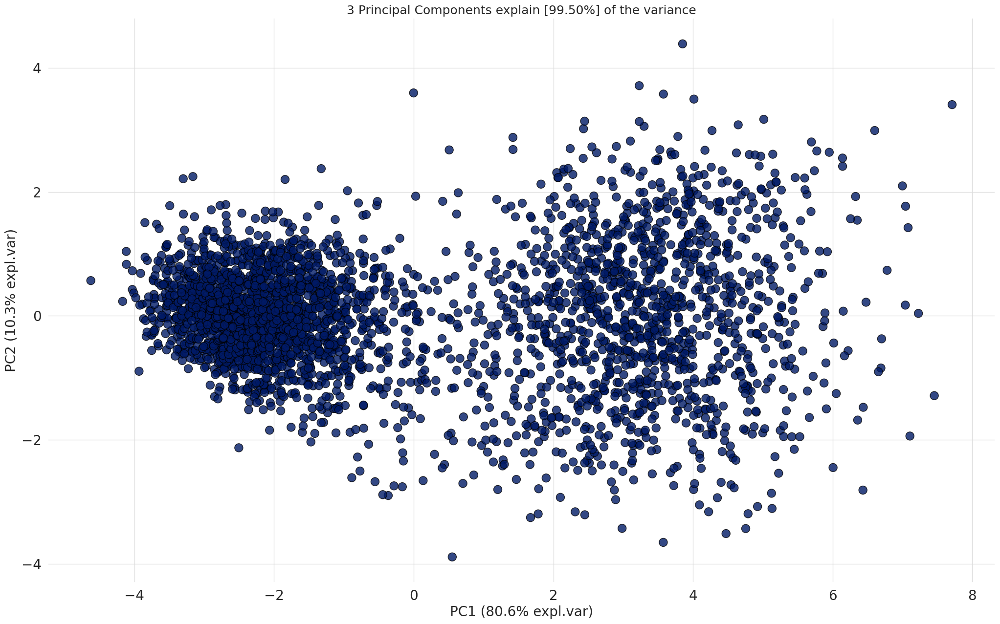

In [30]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [31]:
A = out['loadings'].T

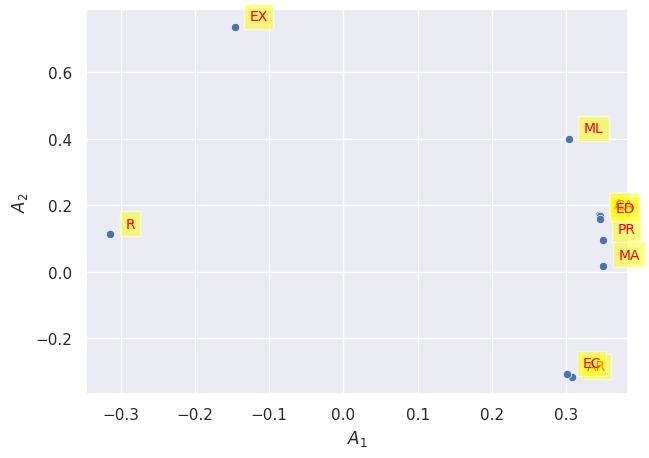

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

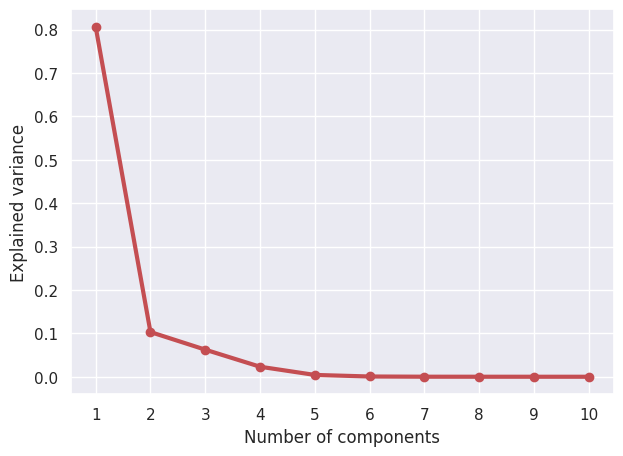

In [32]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

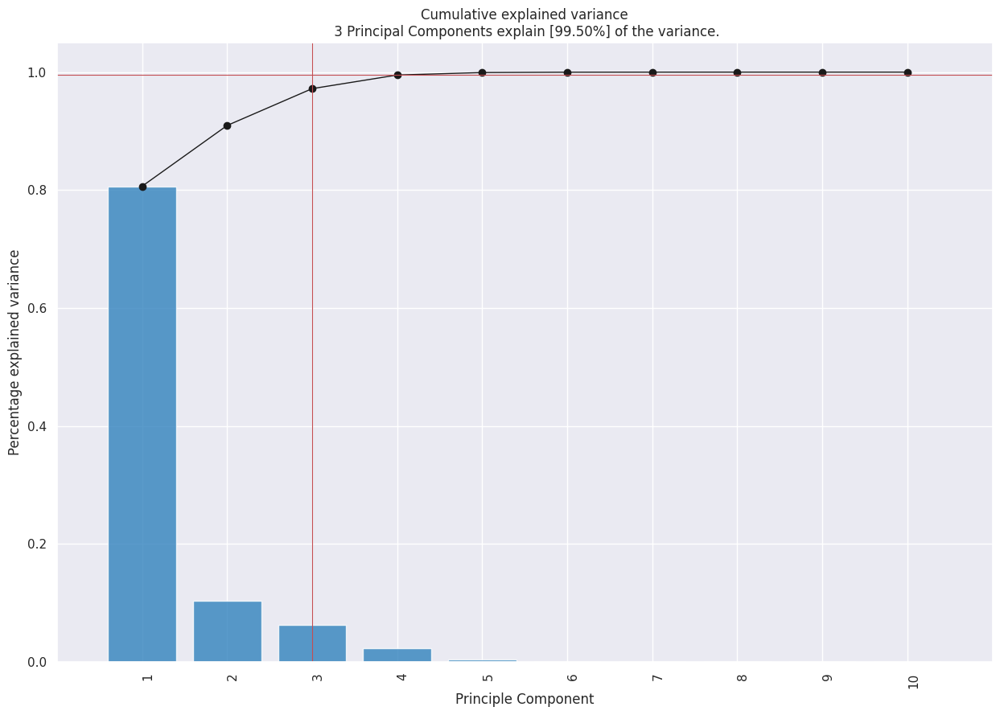

In [33]:
model.plot();

**Biplot**


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot: title={'center': '3 Principal Components explain [99.50%] of the variance'}, xlabel='PC1 (80.6% expl.var)', ylabel='PC2 (10.3% expl.var)'>)

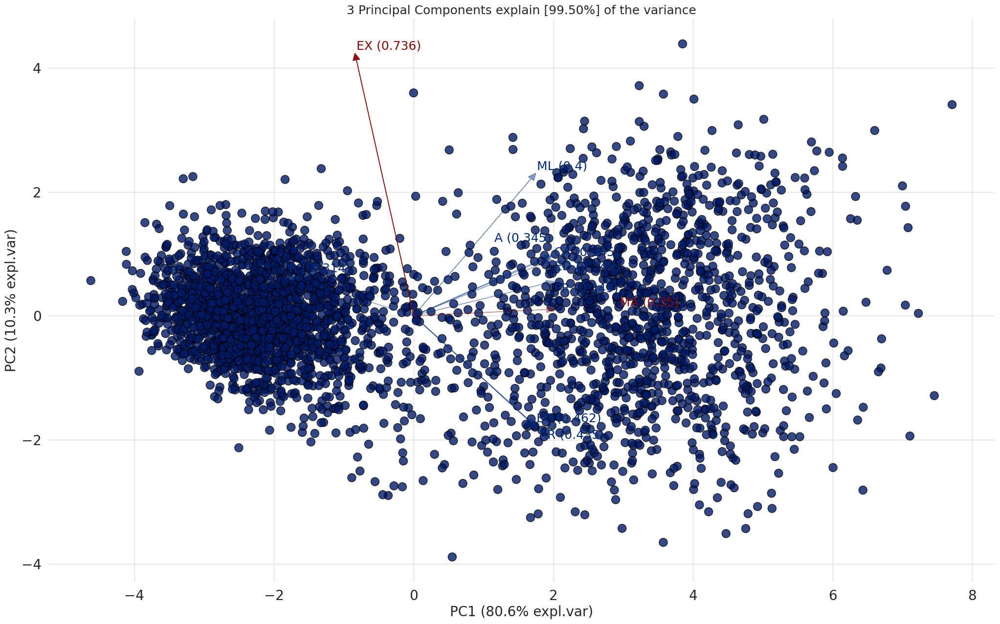

In [34]:
model.biplot(label=False, legend=False)

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot: title={'center': '3 Principal Components explain [99.50%] of the variance'}, xlabel='PC1 (80.6% expl.var)', ylabel='PC2 (10.3% expl.var)', zlabel='PC3 (6.24% expl.var)'>)

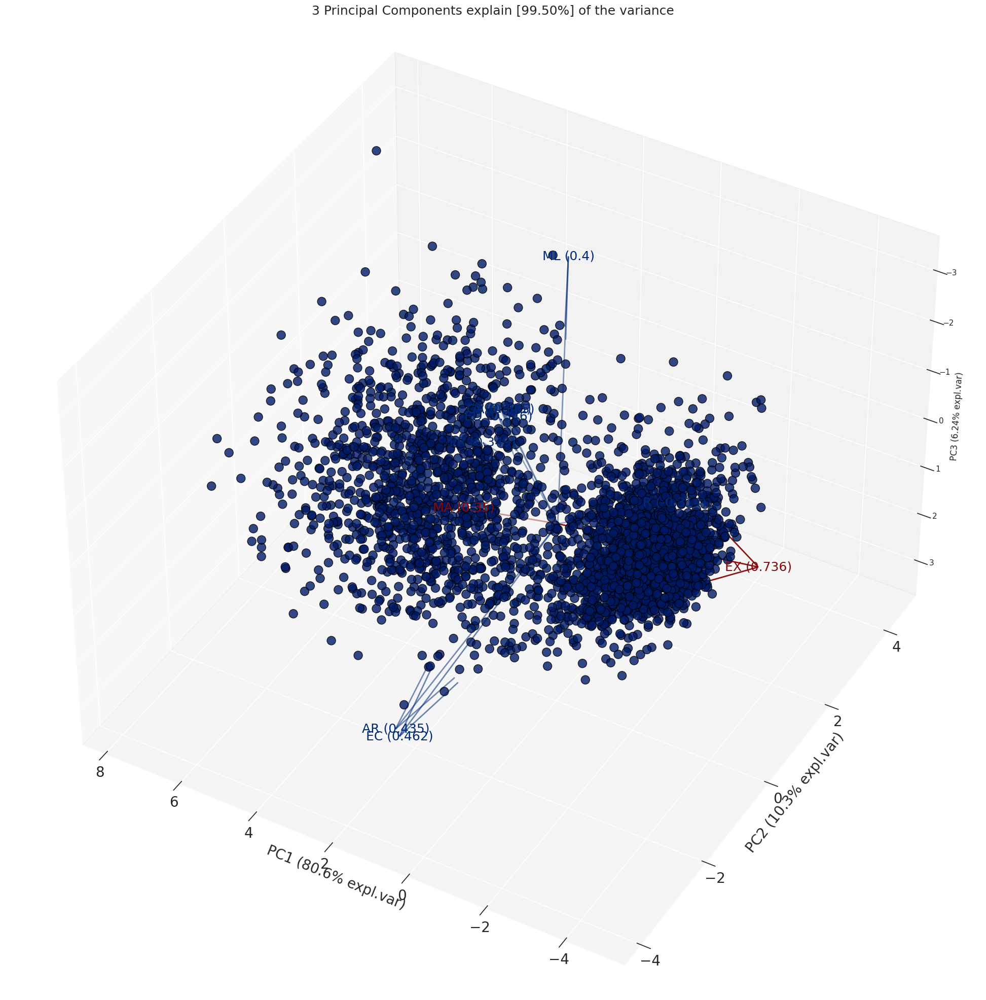

In [35]:
model.biplot3d(legend=False)

# **Classification using Pycaret**



In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab
enable_colab()

In [36]:
from pycaret.utils import version
version()

'3.0.0'

In [37]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (3014, 11)
Unseen Data For Predictions: (335, 11)


In [38]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(3014, 11)"
4,Transformed data shape,"(3014, 11)"
5,Transformed train set shape,"(2109, 11)"
6,Transformed test set shape,"(905, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


# **Comparing All Models**

In [39]:
 #show the best model and their statistics
 best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9905,0.9991,0.9906,0.9937,0.9921,0.9802,0.9803,0.9950
et,Extra Trees Classifier,0.9896,0.9988,0.9898,0.9929,0.9914,0.9782,0.9782,0.4740
rf,Random Forest Classifier,0.9891,0.9988,0.9906,0.9914,0.9910,0.9772,0.9773,0.8160
xgboost,Extreme Gradient Boosting,0.9886,0.9993,0.9898,0.9914,0.9906,0.9762,0.9763,0.1330
lightgbm,Light Gradient Boosting Machine,0.9886,0.9992,0.9898,0.9914,0.9905,0.9762,0.9763,1.0980
dt,Decision Tree Classifier,0.9877,0.9871,0.9898,0.9898,0.9898,0.9742,0.9742,0.0670
ada,Ada Boost Classifier,0.9858,0.9992,0.9882,0.9883,0.9882,0.9702,0.9704,0.3990
lda,Linear Discriminant Analysis,0.9853,0.9990,0.9788,0.9968,0.9877,0.9694,0.9698,0.0690
qda,Quadratic Discriminant Analysis,0.9848,0.9978,0.9820,0.9928,0.9874,0.9684,0.9685,0.0630
ridge,Ridge Classifier,0.9843,0.0000,0.9843,0.9898,0.9870,0.9673,0.9675,0.0490


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

**Comparing best model**

In [40]:
best_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Create Gradient Boosting Classifier**

In [41]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9858,0.9991,0.9844,0.9921,0.9882,0.9703,0.9703
1,0.9858,0.9980,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9858,0.9972,0.9922,0.9845,0.9883,0.9701,0.9702
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9995,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9993,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [42]:
gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Tune Gradient Boosting Classifier**

In [43]:
tuned_gbc=tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9810,0.9994,0.9922,0.9769,0.9845,0.9601,0.9603
1,0.9858,0.9985,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9997,0.9922,0.9922,0.9922,0.9801,0.9801
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9993,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9994,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [44]:
tuned_gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='log_loss', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.05, min_samples_leaf=2,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=140, n_iter_no_change=None,
                           random_state=123, subsample=0.35, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Evaluate Gradient Boosting Classifier Model**

In [45]:
!pip install statsmodels --upgrade

In [46]:
evaluate_model(tuned_gbc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Creating Extra Trees Classifier**

In [47]:
et= create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9858,0.9993,0.9844,0.9921,0.9882,0.9703,0.9703
1,0.9810,0.9984,0.9844,0.9844,0.9844,0.9603,0.9603
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9997,0.9922,0.9922,0.9922,0.9801,0.9801
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9993,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9936,0.9921,0.9921,0.9921,0.9802,0.9802
7,0.9953,1.0000,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9953,1.0000,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [48]:
et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

**Tune Extra Trees Classifier**

In [49]:
tuned_et=tune_model(et)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9716,0.9992,0.9844,0.9692,0.9767,0.9402,0.9404
1,0.9858,0.9992,0.9922,0.9845,0.9883,0.9701,0.9702
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9905,0.9997,0.9922,0.9922,0.9922,0.9801,0.9801
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9994,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9993,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9953,1.0000,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [52]:
tuned_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                     criterion='entropy', max_depth=5, max_features=1.0,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0002, min_samples_leaf=5,
                     min_samples_split=10, min_weight_fraction_leaf=0.0,
                     n_estimators=150, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

**Evaluate  Extra Trees Classifier Model**

In [53]:
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Random Forest Classifier**

In [54]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9993,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9858,0.9981,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9858,0.9996,0.9922,0.9845,0.9883,0.9701,0.9702
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9905,0.9995,0.9921,0.9921,0.9921,0.9802,0.9802
6,0.9905,0.9935,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9953,1.0000,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [55]:
rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

**Tune Random Forest Classifier**

In [56]:
tuned_rf=tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9990,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9858,0.9982,0.9922,0.9845,0.9883,0.9701,0.9702
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9858,0.9995,0.9922,0.9845,0.9883,0.9701,0.9702
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9993,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9994,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [57]:
tuned_rf

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=6, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.001,
                       min_samples_leaf=6, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, n_estimators=190,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

**Evaluate Random Forest Classifier**

In [58]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create Extreme Gradient Boosting**

In [59]:
xgboost= create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9810,0.9995,0.9766,0.9921,0.9843,0.9604,0.9606
1,0.9858,0.9982,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9905,1.0000,1.0000,0.9846,0.9922,0.9801,0.9802
3,0.9858,0.9990,0.9922,0.9845,0.9883,0.9701,0.9702
4,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
5,0.9953,0.9995,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9991,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [60]:
xgboost

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)

**Tune Extreme Gradient Boosting**

In [61]:
tuned_xgboost=tune_model(xgboost)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9858,0.9992,0.9922,0.9845,0.9883,0.9701,0.9702
1,0.9858,0.9990,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9905,1.0000,1.0000,0.9846,0.9922,0.9801,0.9802
3,0.9858,0.9982,0.9922,0.9845,0.9883,0.9701,0.9702
4,0.9953,0.9999,1.0000,0.9922,0.9961,0.9900,0.9901
5,0.9810,0.9978,0.9921,0.9767,0.9844,0.9603,0.9605
6,0.9905,0.9990,1.0000,0.9845,0.9922,0.9801,0.9803
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9953,1.0000,1.0000,0.9922,0.9961,0.9901,0.9901


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [62]:
tuned_xgboost

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)

**Evaluate Extreme Gradient Boosting**

In [64]:
evaluate_model(tuned_xgboost)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Tune the Best Model**

In [65]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9810,0.9994,0.9922,0.9769,0.9845,0.9601,0.9603
1,0.9858,0.9985,0.9922,0.9845,0.9883,0.9701,0.9702
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9997,0.9922,0.9922,0.9922,0.9801,0.9801
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9953,0.9993,0.9921,1.0000,0.9960,0.9901,0.9902
6,0.9905,0.9994,0.9921,0.9921,0.9921,0.9802,0.9802
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [66]:
tuned_best_model

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='log_loss', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.05, min_samples_leaf=2,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=140, n_iter_no_change=None,
                           random_state=123, subsample=0.35, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

**Evaluate the Best Model**

In [67]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Classification + PCA**

In [68]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(3014, 11)"
4,Transformed data shape,"(3014, 4)"
5,Transformed train set shape,"(2109, 4)"
6,Transformed test set shape,"(905, 4)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


# **Comparing models**

In [69]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9858,0.9944,0.9874,0.9890,0.9882,0.9702,0.9703,0.1870
rf,Random Forest Classifier,0.9834,0.9972,0.9851,0.9875,0.9863,0.9653,0.9654,0.7540
nb,Naive Bayes,0.9829,0.9986,0.9772,0.9944,0.9857,0.9645,0.9648,0.2740
svm,SVM - Linear Kernel,0.9829,0.0000,0.9835,0.9883,0.9859,0.9643,0.9645,0.1450
qda,Quadratic Discriminant Analysis,0.9824,0.9986,0.9788,0.9921,0.9854,0.9634,0.9637,0.2320
ridge,Ridge Classifier,0.9820,0.0000,0.9898,0.9806,0.9852,0.9622,0.9623,0.1430
lda,Linear Discriminant Analysis,0.9820,0.9990,0.9898,0.9806,0.9852,0.9622,0.9623,0.2390
lr,Logistic Regression,0.9815,0.9989,0.9851,0.9844,0.9847,0.9613,0.9614,0.1750
xgboost,Extreme Gradient Boosting,0.9815,0.9978,0.9843,0.9852,0.9847,0.9613,0.9614,0.2130
et,Extra Trees Classifier,0.9810,0.9987,0.9827,0.9859,0.9843,0.9603,0.9604,0.5790


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# **Best Model with PCA**

In [70]:
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

# **Tune the Best Model**

In [71]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9984,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9668,0.9914,0.9688,0.9764,0.9725,0.9306,0.9307
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9994,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9953,0.9997,0.9922,1.0000,0.9961,0.9901,0.9901
5,0.9810,0.9948,0.9843,0.9843,0.9843,0.9604,0.9604
6,0.9810,0.9988,0.9843,0.9843,0.9843,0.9604,0.9604
7,0.9905,0.9998,0.9921,0.9921,0.9921,0.9802,0.9802
8,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [72]:
tuned_best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

# **Evaluate the Best Model**

In [73]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [74]:
knn_pca= create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9716,0.9891,0.9844,0.9692,0.9767,0.9402,0.9404
1,0.9763,0.9829,0.9766,0.9843,0.9804,0.9505,0.9505
2,0.9953,0.9937,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9936,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9953,0.9960,0.9922,1.0000,0.9961,0.9901,0.9901
5,0.9858,0.9953,0.9843,0.9921,0.9881,0.9704,0.9704
6,0.9763,0.9953,0.9764,0.9841,0.9802,0.9507,0.9507
7,0.9953,0.9998,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9905,0.9998,0.9921,0.9921,0.9921,0.9802,0.9802


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune KNN Model**

In [75]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9984,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9668,0.9914,0.9688,0.9764,0.9725,0.9306,0.9307
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9994,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9953,0.9997,0.9922,1.0000,0.9961,0.9901,0.9901
5,0.9810,0.9948,0.9843,0.9843,0.9843,0.9604,0.9604
6,0.9810,0.9988,0.9843,0.9843,0.9843,0.9604,0.9604
7,0.9905,0.9998,0.9921,0.9921,0.9921,0.9802,0.9802
8,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate KNN Model**

In [76]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

In [77]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create Random Forest Classifier Model**

In [78]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9984,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9668,0.9931,0.9688,0.9764,0.9725,0.9306,0.9307
2,0.9905,1.0000,1.0000,0.9846,0.9922,0.9801,0.9802
3,0.9905,0.9989,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9858,0.9978,0.9844,0.9921,0.9882,0.9703,0.9703
5,0.9810,0.9927,0.9843,0.9843,0.9843,0.9604,0.9604
6,0.9763,0.9935,0.9764,0.9841,0.9802,0.9507,0.9507
7,0.9953,0.9997,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9953,1.0000,0.9921,1.0000,0.9960,0.9901,0.9902


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Random Forest Classifier Model**

In [79]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9984,0.9844,0.9767,0.9805,0.9502,0.9503
1,0.9716,0.9909,0.9688,0.9841,0.9764,0.9407,0.9409
2,0.9953,1.0000,1.0000,0.9922,0.9961,0.9900,0.9901
3,0.9905,0.9985,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9905,0.9972,0.9844,1.0000,0.9921,0.9802,0.9804
5,0.9810,0.9931,0.9764,0.9920,0.9841,0.9606,0.9608
6,0.9810,0.9934,0.9764,0.9920,0.9841,0.9606,0.9608
7,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9905,0.9997,0.9843,1.0000,0.9921,0.9803,0.9805


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [80]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_samples_leaf=5, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

# **Evaluate Random Forest Classifier Model**

In [81]:
evaluate_model(tuned_rf_pca )

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create Naive Bayes Model**

In [82]:
nb_pca = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9810,0.9988,0.9766,0.9921,0.9843,0.9604,0.9606
1,0.9716,0.9969,0.9688,0.9841,0.9764,0.9407,0.9409
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9905,0.9996,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9858,0.9995,0.9766,1.0000,0.9881,0.9704,0.9708
5,0.9763,0.9954,0.9606,1.0000,0.9799,0.9510,0.9522
6,0.9810,0.9989,0.9764,0.9920,0.9841,0.9606,0.9608
7,0.9953,0.9998,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9858,0.9995,0.9764,1.0000,0.9880,0.9705,0.9709


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Naive Bayes Model**

In [83]:
tuned_nb_pca = tune_model(nb_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9763,0.9989,0.9766,0.9843,0.9804,0.9505,0.9505
1,0.9716,0.9968,0.9688,0.9841,0.9764,0.9407,0.9409
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9905,0.9996,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9858,0.9996,0.9766,1.0000,0.9881,0.9704,0.9708
5,0.9810,0.9955,0.9685,1.0000,0.9840,0.9608,0.9615
6,0.9810,0.9989,0.9764,0.9920,0.9841,0.9606,0.9608
7,0.9953,0.9999,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9858,0.9997,0.9764,1.0000,0.9880,0.9705,0.9709


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


# **Evaluate Naive Bayes Model**

In [86]:
tuned_nb_pca

GaussianNB(priors=None, var_smoothing=0.01)

In [87]:
evaluate_model(tuned_nb_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Explainable AI with Shapley values**

In [88]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9716,0.9985,0.9844,0.9692,0.9767,0.9402,0.9404
1,0.9668,0.9971,0.9688,0.9764,0.9725,0.9306,0.9307
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9858,0.9994,0.9922,0.9845,0.9883,0.9701,0.9702
4,0.9905,0.9996,0.9844,1.0000,0.9921,0.9802,0.9804
5,0.9763,0.9980,0.9764,0.9841,0.9802,0.9507,0.9507
6,0.9716,0.9980,0.9764,0.9764,0.9764,0.9407,0.9407
7,0.9905,0.9985,0.9921,0.9921,0.9921,0.9802,0.9802
8,0.9858,1.0000,0.9764,1.0000,0.9880,0.9705,0.9709


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [89]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9810,0.9986,0.9766,0.9921,0.9843,0.9604,0.9606
1,0.9716,0.9964,0.9688,0.9841,0.9764,0.9407,0.9409
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9905,0.9996,0.9922,0.9922,0.9922,0.9801,0.9801
4,0.9858,0.9994,0.9766,1.0000,0.9881,0.9704,0.9708
5,0.9763,0.9930,0.9685,0.9919,0.9801,0.9509,0.9513
6,0.9810,0.9986,0.9764,0.9920,0.9841,0.9606,0.9608
7,0.9953,0.9995,0.9921,1.0000,0.9960,0.9901,0.9902
8,0.9858,0.9996,0.9764,1.0000,0.9880,0.9705,0.9709


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [90]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0.0005,
                     min_samples_leaf=3, min_samples_split=5,
                     min_weight_fraction_leaf=0.0, n_estimators=260, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [91]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [92]:
!pip install shap

In [93]:
import shap

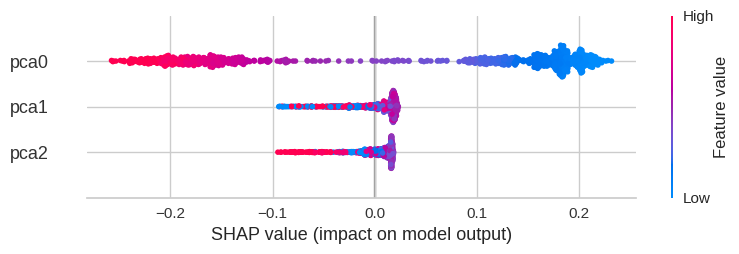

In [94]:
interpret_model(tuned_et_pca, plot='summary')

In [95]:
interpret_model(tuned_et_pca, plot='reason', observation=32)